In [1]:
import torch
import networkx as nx
from opencast import OPENCAST
from oneclass import one_class_loss, one_class_masking, One_Class_GNN_prediction
from torch_geometric.utils.convert import from_networkx
from torch_geometric.nn.models.autoencoder import GAE
import numpy as np
import pandas as pd
import random
from sklearn.neighbors import kneighbors_graph
from scipy.io import arff
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.io as pio
pio.renderers.default = 'iframe'
import warnings
from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)

/home/golo/miniconda3/envs/opencast_env/lib/python3.11/site-packages/torch_geometric/typing.py:68: UserWarning: An issue occurred while importing 'pyg-lib'. Disabling its usage. Stacktrace: /home/golo/miniconda3/envs/opencast_env/lib/python3.11/site-packages/libpyg.so: undefined symbol: _ZN3c1010Dispatcher17runRecordFunctionERN2at14RecordFunctionESt17reference_wrapperIKNS_14FunctionSchemaEENS_11DispatchKeyE
  warnings.warn(f"An issue occurred while importing 'pyg-lib'. "
/home/golo/miniconda3/envs/opencast_env/lib/python3.11/site-packages/torch_geometric/typing.py:86: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: /home/golo/miniconda3/envs/opencast_env/lib/python3.11/site-packages/torch_scatter/_version_cuda.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKSs
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/home/golo/miniconda3/envs/opencast_env/lib/python3.11/site-packages/torch_geometric/typing.py:97: U

In [2]:
def generate_graph(df, len_train, k, interest_class):
    y = df['class']
    df = df.drop(columns=['class'])

    A = kneighbors_graph(df.values, k, mode='connectivity', include_self=False)
    g = nx.Graph(A)
    
    for node in g.nodes():
        g.nodes[node]['features'] = df.loc[node].values
        g.nodes[node]['label'] = 1 if y.loc[node] == interest_class else 0
        if node < len_train:
            g.nodes[node]['train'] = 1
            g.nodes[node]['test'] = 0
        else:
            g.nodes[node]['train'] = 0
            g.nodes[node]['test'] = 1
    return g

def defining_training_instances(df_old, iteration, interest_class):
    if iteration == 0:
        df_t_i = df_old[df_old['class'] == interest_class]
        return df_t_i
    else:
        df_t_i = df_old[df_old['class'] == interest_class]
        l = len(df_t_i)
        if l <= 2500:
            return df_t_i
        else:
            return df_t_i[l-2500:]

In [3]:
data, meta = arff.loadarff('./datasets/tweet500.arff')
df = pd.DataFrame(data).astype(int)
interest_class = 1

new_df = df.iloc[:2500]
iteration = 0
for i in range(2500,len(df),2500):
    print(f'Itareation: {iteration}')
    mantaining = defining_training_instances(new_df, iteration, interest_class)
    if i+5000 > len(df):
        end = len(df)
    else:
        end = i + 2500
    new_df = pd.concat([mantaining, df.iloc[i:end]], ignore_index=True)
    g = generate_graph(new_df, len(mantaining), 1, interest_class)
    if iteration == 0:
        break
    iteration+=1

Itareation: 0


In [4]:
from plotly import graph_objs as go

def show_graph(G):
  ### ARESTAS
  edge_x = []
  edge_y = []

  # adicionando as coordenadas
  for edge in G.edges():
      x0, y0 = G.nodes[edge[0]]['pos']
      x1, y1 = G.nodes[edge[1]]['pos']
      edge_x.append(x0)
      edge_x.append(x1)
      edge_x.append(None)
      edge_y.append(y0)
      edge_y.append(y1)
      edge_y.append(None)

  # definindo cor e estilo das arestas
  edge_trace = go.Scatter(
      x=edge_x, y=edge_y,
      line=dict(width=1.5, color='#888'),
      hoverinfo='none',
      mode='lines')

  ### VÉRTICES
  node_x = []
  node_y = []

  # adicionando as coordenadas
  for node in G.nodes():
      x, y = G.nodes[node]['pos']
      node_x.append(x)
      node_y.append(y)

  # definindo cor e estilo dos vértices
  node_trace = go.Scatter(
      x=node_x, y=node_y,
      mode='markers',
      hoverinfo='text',
      marker=dict(
          size=8,
          line_width=1))


  node_labels = []
  for node in G.nodes():
    node_labels.append(G.nodes[node]['label'])

  node_trace.marker.color = node_labels

  # visualizando!
  fig = go.Figure(data=[edge_trace, node_trace],
              layout=go.Layout(
                  showlegend=False,
                  hovermode='closest',
                  margin=dict(b=20,l=5,r=5,t=40),
                  xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                  yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

  fig.update_layout(width=500)
  fig.add_trace(go.Scatter(x=[0],y=[0], mode='markers', marker=dict(size=5,line_width=2, color='red')))
  fig.add_trace(go.Scatter(x=[0],y=[0], mode='markers', marker=dict(size=120,line_width=2, color='red', symbol='circle-open')))
  fig.show()

In [5]:
hidden1, hidden2, patience, lr, r, multi_task, epochs, eps, num_layers, alpha = 48, 2, 500, 0.001, 0.3, 300, 2000, 0.2, 2, 0.5

In [6]:
embeddings = []
losses_ocl = []
losses_rec = []
accuracies = []
losses = []

seed = 8
np.random.seed(seed)
torch.manual_seed(seed)
random.seed(seed)
torch.cuda.manual_seed_all(seed)

device = torch.device('cuda:0')
center = torch.Tensor([0] * hidden2).to(device)
radius = torch.Tensor([r]).to(device)

mask, t_mask, mask_unsup, t_mask_unsup = one_class_masking(g, False)
G = from_networkx(g).to(device)
g_unsup = g.subgraph(t_mask_unsup)
G_unsup = from_networkx(g_unsup).to(device)
model_ocl = OPENCAST(len(G.features[0]), [hidden1, hidden2], num_layers, eps)
model = GAE(model_ocl).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

for epoch in range(epochs+1):
    # Clear gradients
    optimizer.zero_grad()

    # Forward pass
    learned_representations = model.encode(G.features.float(), G.edge_index)

    if epoch < multi_task:
        loss_ocl = one_class_loss(center, radius, learned_representations, mask)
        recon_loss = model.recon_loss(learned_representations, G.edge_index)
        loss = recon_loss
    else:
        loss_ocl = one_class_loss(center, radius, learned_representations, mask)
        recon_loss = model.recon_loss(learned_representations[mask_unsup], G_unsup.edge_index)
        loss = (loss_ocl*alpha) + ((1-alpha) * recon_loss)
        
    f1 = One_Class_GNN_prediction(center, radius, learned_representations, g, 'test', True)['macro avg']['f1-score']   
    accuracies.append(f1)
        
    # Compute gradients
    loss.backward()

    # Tune parameters
    optimizer.step()
    embeddings.append(learned_representations)
    losses_ocl.append(loss_ocl.detach().cpu().numpy())
    losses_rec.append(recon_loss.detach().cpu().numpy())
    losses.append(loss.detach().cpu().numpy())

In [7]:
One_Class_GNN_prediction(center, radius, learned_representations, g, 'test', False)

              precision    recall  f1-score   support

          -1       0.86      0.89      0.88      1605
           1       0.79      0.74      0.77       895

    accuracy                           0.84      2500
   macro avg       0.83      0.82      0.82      2500
weighted avg       0.84      0.84      0.84      2500



In [8]:
epoch=2000
for node in g.nodes():
  g.nodes[node]['pos'] = embeddings[epoch][node].detach().cpu().numpy()
show_graph(g)

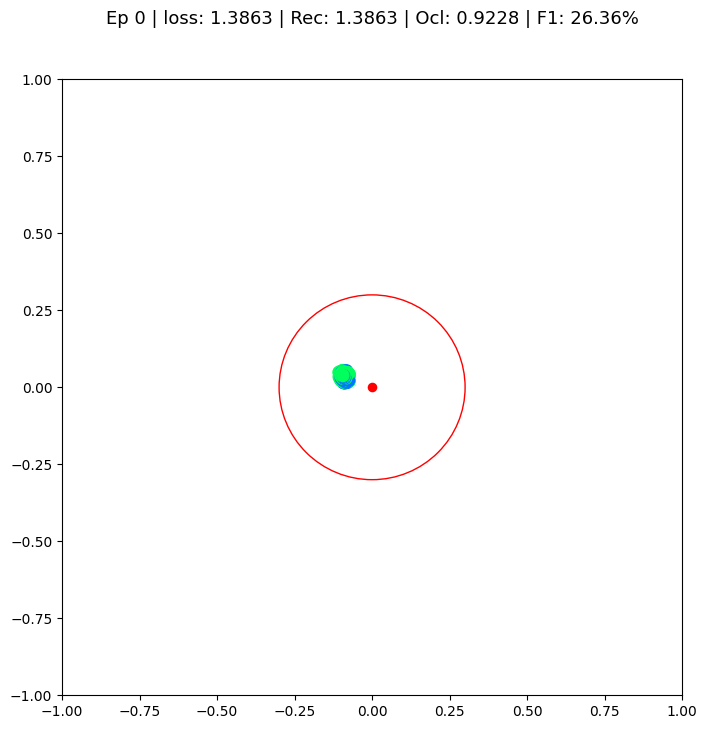

In [9]:
import matplotlib.pyplot as plt
from IPython.display import HTML
from IPython.display import display
from matplotlib import animation

def animate(i):
    embed = embeddings[int(i)].detach().cpu().numpy()
    r = 0.3
    ax.clear()
    ax.scatter(embed[:, 0], embed[:, 1], s=75, c=G.label.detach().cpu().numpy(), cmap="hsv", vmin=-2, vmax=3)
    ax.scatter(0, 0, s=35, c='red', cmap="hsv", vmin=-2, vmax=3)
    circle = plt.Circle((0, 0), r, color='red', fill=False)
    plt.gca().add_artist(circle)
    plt.title(f'Ep {i} | loss: {losses[int(i)]:.4f} | Rec: 'f'{losses_rec[int(i)]:.4f} | Ocl: 'f'{losses_ocl[int(i)]:.4f} | F1: {accuracies[int(i)]*100:.2f}%', fontsize=13, pad=40)
    plt.xlim([-1, 1])
    plt.ylim([-1, 1])

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot()
anim = animation.FuncAnimation(fig, animate, np.arange(0, 2000, 20), interval=800, repeat=True)
html = HTML(anim.to_html5_video())
display(html)